# P4 Advanced Lane Lines
## Thomas J. Chmielenski
## September 2017
---

In this project, the goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. The camera calibration images, test road images, and project videos are available  in this project repository.

More specifically, the goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.



### 1.  Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.


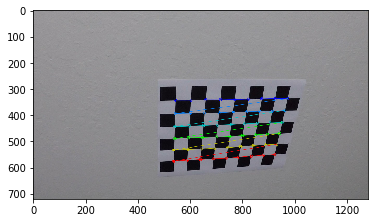

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

%matplotlib inline

def  compute_camera_calibration_coefficents(calibration_images ='./camera_cal/calibration*.jpg', nx = 9, ny =6):
    images = glob.glob(calibration_images)

    # Arrays to store object points and image points from all the images
    objpoints =[] #3D points in real world space
    imgpoints =[] #2D points in image plane

    # Prepare object points, like (0,0, 0), (1,0,0), (2,0,0), ...,  (7,5,0)
    objp = np.zeros((ny * nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2) 

    for fname in images:
        # Read om each image
        img = mpimg.imread(fname)
    
        # Convert image to grayscale
        # mpimg.imread() this will read in an RGB image
        # cv2.imread () or glob API this will read in a BGR image
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
               
            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            if (len(objpoints) == 1):                               
                # first out the first image
                plt.imshow(img)
                plt.savefig('./output_images/chessboard.png')
                plt.show()

    # To calibrate a camera
    # gray.shape[::-1] is equivalent to img.shape[0:2] <-- first two values of a color image shape
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return (ret, mtx, dist, rvecs, tvecs)

nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
(ret, mtx, dist, rvecs, tvecs) = compute_camera_calibration_coefficents (calibration_images =  './camera_cal/calibration*.jpg', nx = nx, ny = ny)

dist_pickle = {}
dist_pickle['mtx'] = mtx
dist_pickle['dist'] = dist
pickle.dump(dist_pickle, open( "./calibration_pickle.p", "wb"))

# Undistort
#dst = cv2.undistort(img, mtx, dist, None, mtx)


### 2.  Apply a distortion correction to raw images.

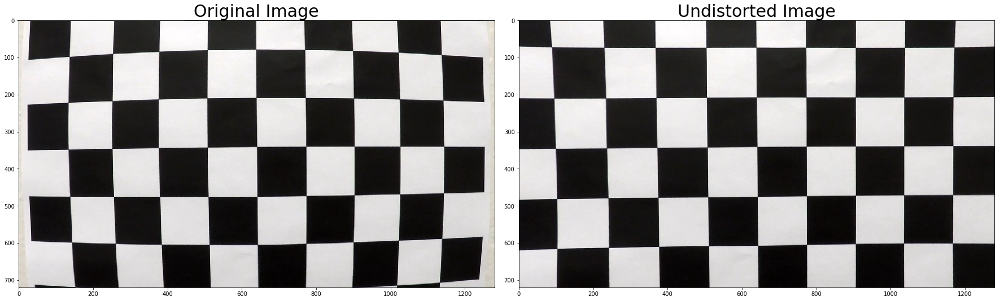

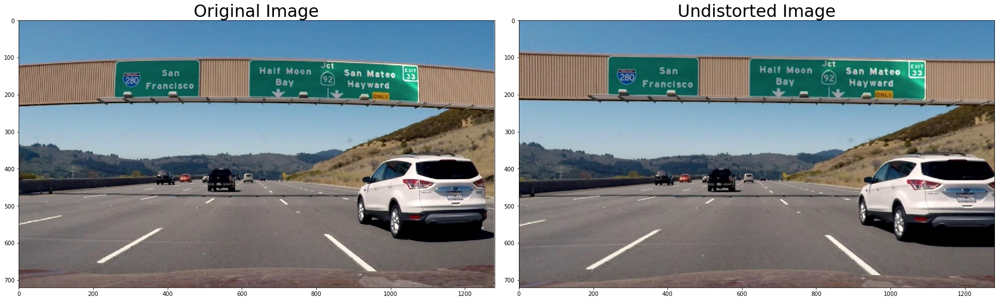

In [2]:
# Plot the result
def plotImage(image, image_cmap=None,  save_filename=None):
    plt.imshow(image,cmap=image_cmap)
    if save_filename:
        plt.savefig(save_filename)
    plt.show()

def plot3images(image1, image2, image3, title1, title2, title3, 
                image1cmap=None, image2cmap='gray',image3cmap='gray', save_filename=None):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1, cmap=image1cmap)
    ax1.set_title(title1, fontsize= 20)
    ax2.imshow(image2, cmap=image2cmap)
    ax2.set_title(title2, fontsize= 20)
    ax3.imshow(image3, cmap=image1cmap)
    ax3.set_title(title3, fontsize= 20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if save_filename:
        plt.savefig(save_filename)
    plt.show()

def plot2images(image1, image2, title1, title2, image1cmap=None, image2cmap='gray', save_filename=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1, cmap=image1cmap)
    ax1.set_title(title1, fontsize= 30)
    ax2.imshow(image2, cmap=image2cmap)
    ax2.set_title(title2, fontsize= 30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if save_filename:
        plt.savefig(save_filename)
    plt.show()
    
image = mpimg.imread('./camera_cal/calibration1.jpg')
dst = cv2.undistort(image, mtx, dist, None, mtx)
plot2images(image1=image, image2=dst, title1='Original Image', title2='Undistorted Image', save_filename='output_images/orig_vs_undistorted_image.png')

image = mpimg.imread('./examples/signs_vehicles_xygrad.png')
dst = cv2.undistort(image, mtx, dist, None, mtx)
plot2images(image1=image, image2=dst, title1='Original Image', title2='Undistorted Image', save_filename='output_images/orig_vs_undistorted_image2.png')



### 3.  Use color transforms, gradients, etc., to create a thresholded binary image.

Notes:

* RGB matplotlib.image.imread()
* BGR cv2.imread()
* HSV color space (hue, saturation, and value), and 
* HLS space (hue, lightness, and saturation)
* LUV space


In [3]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def apply_region_of_interest_mask(img):
    x_factor = 60
    y_factor = 50
    vertices = np.array([[
        (0,image.shape[0]),
        (((image.shape[1]/2)- x_factor), (image.shape[0]/2)+ y_factor), 
         (((image.shape[1]/2) + x_factor), (image.shape[0]/2)+ y_factor), 
         (image.shape[1],image.shape[0])]], dtype=np.int32)
    #print (vertices)
    return region_of_interest(img, vertices)



In [4]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    #plot2images(image1=image, image2=grad_binary, title1='Original Image', title2='thresholded y-derivative', save_filename='output_images/thresholdedy-derivative.png')

    # Return the result
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    #plot2images(image1=image, image2=mag_binary, title1='Original Image', title2='Thresholded Magnitude', save_filename='output_images/thresholded_magnitude.png')

    # Return the binary image
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    
    # Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    #plot2images(image1=image, image2=dir_binary, title1='Original Image', title2='Thresholded Direction', save_filename='output_images/thresholded_direction.png')

    return dir_binary


#Self-Driving Car Project Q&A | Advanced Lane Finding
def color_threshold(image, s_thresh=(0, 255), v_thresh=(0, 255)):
    # Convert to HLS
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    s_binary = np.zeros_like(S)
    s_binary[(S > s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    V = hsv[:,:,2]
    
    v_binary = np.zeros_like(V)
    v_binary[(S > v_thresh[0]) & (V <= v_thresh[1])] = 1
    
    combined = np.zeros_like(S)
    combined[((s_binary == 1) & (v_binary == 1))] = 1
    
    return combined

In [5]:
if (False):
    def extract_yellow_lanes(image):
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        lower_yellow = np.array([0,100,100])
        upper_yellow = np.array([50,255,255])
        ###lower_yellow = np.array([20,50,100])
        ###upper_yellow = np.array([40,255,255])

        yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
        return yellow

    def extract_white_lanes(image):
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        lower_white = np.array([20,0,180])
        upper_white = np.array([255,80,255])

       # v_binary = np.zeros_like(V)
       # v_binary[(S > v_thresh[0]) & (V <= v_thresh[1])] = 1

        white = cv2.inRange(hsv, lower_white, upper_white)
        return white

    def R_thres(image, r_thresh=(0, 255)):
        # Calculate the R Channel Threshold
        R = image[:,:,0]
        r_binary = np.zeros_like(R)
        r_binary[(R > r_thresh[0]) & (R <= r_thresh[1])] = 1
        return r_binary

    def color_threshold2(image, s_thresh=(0, 255), v_thresh=(0, 255)):

        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        V = hsv[:,:,2]

        yellow = extract_yellow_lanes(image)
        #white = extract_white_lanes(image)
        white = R_thres(image, (100,255))

        combined = np.zeros_like(V)
        combined[((yellow == 1) & (white == 1))] = 1

        return combined



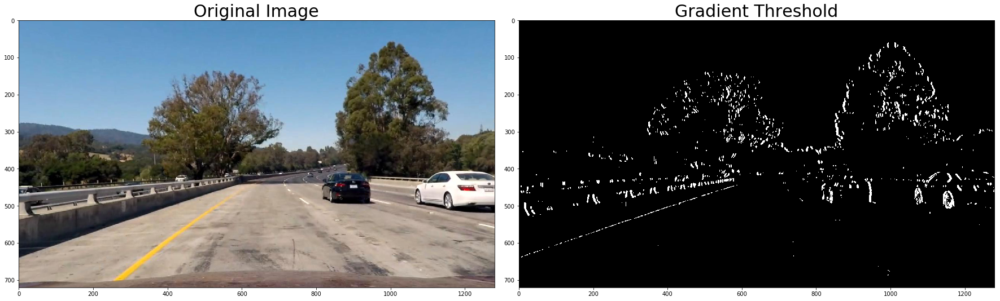

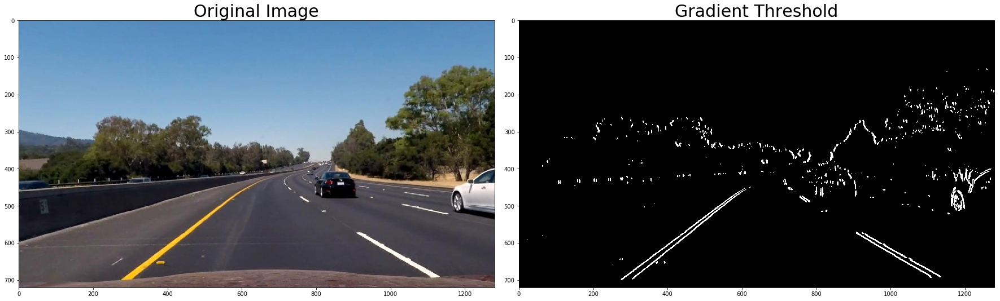

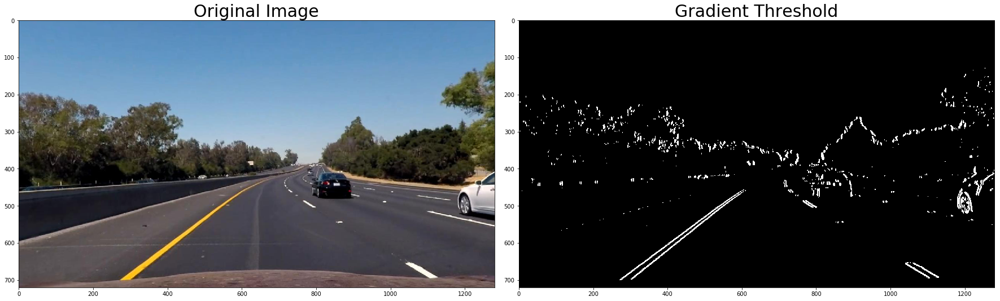

In [6]:
if (True):
    #images = glob.glob('./test_frame_images/frame_*.jpg')
    images = glob.glob('./test_frame_images/frame_4*.jpg')
    #images = glob.glob('./examples/signs_vehicles_xygrad.png')
    #images = glob.glob('./examples/*shadow*.jpg')

    for idx, fname in enumerate(images):
        # read in image
        img =  mpimg.imread(fname)

        # undistort the image
        img = cv2.undistort(img, mtx, dist, None, mtx)

        # focus on the area of interest
        #img = apply_region_of_interest_mask(img)

        # Run the function
        gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=11, thresh=(50,255))
        #grady = abs_sobel_thresh(img, orient='y', sobel_kernel=11, thresh=(100, 255))
        mag_binary = mag_thresh(img, sobel_kernel=11, mag_thresh=(150, 255))
        dir_binary = dir_threshold(img, sobel_kernel=11, thresh=(0.7, 1,3))

        combined = np.zeros_like(img[:,:,0])
        combined[((gradx == 1) ) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        plot2images(image1=img, image2=combined, title1='Original Image', title2='Gradient Threshold', save_filename='output_images/combined_thresholds.png')



In [7]:
if (False):
    #images = glob.glob('./test_frame_images/frame_*.jpg')
    images = glob.glob('./test_frame_images/frame_45.jpg')
    #images = glob.glob('./examples/signs_vehicles_xygrad.png')
    #images = glob.glob('./examples/bridge_shadow.png')
    #images = glob.glob('./examples/color-shadow-example.png')
    images = glob.glob('./examples/*shadow*.jpg')

    for idx, fname in enumerate(images):
        # read in image
        img =  mpimg.imread(fname)

        # undistort the image
        img = cv2.undistort(img, mtx, dist, None, mtx)

        thresh = (180, 255)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        binary = np.zeros_like(gray)
        binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
        #plot2images(image1=gray, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='Gray', title2='Binary Gray', 
        #            save_filename='output_images/color_gray.png')

        R = img[:,:,0]
        G = img[:,:,1]
        B = img[:,:,2]
        #plot2images(image1=R, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='R Channel', title2='R Binary', 
        #            save_filename='output_images/color_red.png')
        thresh = (200, 255)
        binary = np.zeros_like(R)
        binary[(R > thresh[0]) & (R <= thresh[1])] = 1
        #plot2images(image1=R, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='R Channel', title2='R Binary', 
        #            save_filename='output_images/color_red.png')

        Lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        L = Lab[:,:,0]
        a = Lab[:,:,1]
        b = Lab[:,:,2]
        #plot3images(image1=L, image2=a, image3=b, 
        #            image1cmap='gray', image2cmap='gray', image3cmap='gray',
        #            title1='L', title2='a', title3='b',
        #            save_filename='output_images/color_lab.png')

        thresh = (200, 255)
        binary = np.zeros_like(L)
        binary[(L > thresh[0]) & (L <= thresh[1])] = 1
        #plot2images(image1=L, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='L Channel', title2='L Binary', 
        #            save_filename='output_images/color_L.png')

        thresh = (0, 255)
        binary = np.zeros_like(a)
        binary[(a > thresh[0]) & (a <= thresh[1])] = 1
        #plot2images(image1=a, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='a Channel', title2='a Binary', 
        #            save_filename='output_images/color_a.png')

        thresh = (200, 255)
        binary = np.zeros_like(b)
        binary[(b > thresh[0]) & (b <= thresh[1])] = 1
        #plot2images(image1=b, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='b Channel', title2='b Binary', 
        #            save_filename='output_images/color_b.png')
        
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        H = hls[:,:,0]
        L = hls[:,:,1]
        S = hls[:,:,2]
        plot3images(image1=H, image2=L, image3=S, 
                    image1cmap='gray', image2cmap='gray', image3cmap='gray',
                    title1='H', title2='L', title3='S',
                    save_filename='output_images/color_hls.png')
        
        #thresh = (90, 255)
        #binary = np.zeros_like(L)
        #binary[(L > thresh[0]) & (L <= thresh[1])] = 1
        #plot2images(image1=L, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #            title1='L Channel', title2='L Binary', 
        #            save_filename='output_images/color_L.png')

        thresh = (90, 255)
        binary = np.zeros_like(S)
        binary[(S > thresh[0]) & (S <= thresh[1])] = 1

        plot2images(image1=S, image2=binary, 
                    image1cmap='gray', image2cmap='gray',
                    title1='S Channel', title2='s Binary', 
                    save_filename='output_images/color_S.png')

        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        H = hls[:,:,0]
        S = hls[:,:,1]
        V = hls[:,:,2]

        plot3images(image1=H, image2=S, image3=V, 
                    image1cmap='gray', image2cmap='gray', image3cmap='gray',
                    title1='H', title2='S', title3='V',
                    save_filename='output_images/color_hsv.png')
        # SSS
        #thresh = (180, 255)
        #binary = np.zeros_like(S)
        #binary[(S > thresh[0]) & (S <= thresh[1])] = 1

        #plot2images(image1=S, image2=binary, 
        #            image1cmap='gray', image2cmap='gray',
        #           title1='S Channel', title2='s Binary', 
        #            save_filename='output_images/color_S.png')


        # VVV
        thresh = (180,255)
        binary = np.zeros_like(V)
        binary[(L > thresh[0]) & (L <= thresh[1])] = 1

        plot2images(image1=V, image2=binary, 
                    image1cmap='gray', image2cmap='gray',
                    title1='V Channel', title2='V Binary', 
                    save_filename='output_images/color_V.png')


In [8]:
def combined_color_and_gradient4(image):
    ksize=7

    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(12, 255))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(150, 255))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1,3))

    combined = np.zeros_like(image[:,:,0])
    combined[((gradx == 1) & (grady == 1) ) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    #plot2images(image1=img, image2=combined, title1='Original Image', title2='X, Y, Mag, Dir Threshold 2', save_filename='output_images/combined_xymagdir.png')
   
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    s_thresh = (90, 255)
    s_binary = np.zeros_like(S)
    s_binary[(S > s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    V = hsv[:,:,2]
    
    v_thresh = (210, 255)
    v_binary = np.zeros_like(V)
    v_binary[(S > v_thresh[0]) & (V <= v_thresh[1])] = 1
    
    color_binary = np.zeros_like(S)
    color_binary[((s_binary == 1) & (v_binary == 1))] = 1
    #plot2images(image1=img, image2=color_binary, title1='Original Image', title2='Color Threshold', save_filename='output_images/color.png')
    
   # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    stacked_binary = np.dstack(( np.zeros_like(combined), combined, color_binary)) * 255

    # Combine the two binary thresholds
    both_binary = np.zeros_like(combined)
    both_binary[(combined == 1) | (color_binary == 1)] = 1

    if (False):
        # Plotting thresholded images
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('Stacked thresholds')
        ax1.imshow(stacked_binary)
        ax2.set_title('Combined Gradient and Color thresholds')
        ax2.imshow(both_binary, cmap='gray')
        plt.show()
        
    #return combined
    #    return color_binary
    return both_binary
    

def combined_color_and_gradient3(img):
    kernel_size = 9
    
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=kernel_size, thresh=(50,255))
    #grady = abs_sobel_thresh(img, orient='y', sobel_kernel=11, thresh=(100, 255))
    mag_binary = mag_thresh(img, sobel_kernel=kernel_size, mag_thresh=(150, 255))
    dir_binary = dir_threshold(img, sobel_kernel=kernel_size, thresh=(0.7, 1,3))
    
    combined = np.zeros_like(img[:,:,0])
    combined[((gradx == 1) ) | ((mag_binary == 1) & (dir_binary == 1))] = 1
   
    #plot2images(image1=img, image2=combined, title1='Original Image', title2='X, Y, Mag, Dir Thresholds', save_filename='output_images/combined_xymagdir.png')

    LUV = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    L = LUV[:,:,0]
    
    thresh = (170, 255)
    l_binary = np.zeros_like(L)
    l_binary[(L > thresh[0]) & (L <= thresh[1])] = 1

    s_thresh = (155, 200)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    S = hls[:,:,1]
    s_binary = np.zeros_like(S)
    s_binary[(S > s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    color_binary = np.zeros_like(l_binary)
    color_binary[(l_binary == 1) | (s_binary == 1)] = 1

    #plot2images(image1=img, image2=color_binary, title1='Original Image', title2='Color Threshold', save_filename='output_images/color.png')
 
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    stacked_binary = np.dstack(( np.zeros_like(combined), combined, color_binary)) * 255

    # Combine the two binary thresholds
    both_binary = np.zeros_like(combined)
    both_binary[(combined == 1) | (color_binary == 1)] = 1

    if (False):
        # Plotting thresholded images
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('Stacked thresholds')
        ax1.imshow(stacked_binary)
        ax2.set_title('Combined S channel and gradient thresholds')
        ax2.imshow(both_binary, cmap='gray')
        plt.show()
        
    return both_binary

def combined_color_and_gradient(image):    
    ksize=3
    preprocessImage = np.zeros_like(image[:,:,0])
    
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(50, 150))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    
    # Convert to HLS
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    s_thresh = (50, 255)
    s_binary = np.zeros_like(S)
    s_binary[(S > s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    V = hsv[:,:,2]
    
    v_thresh=(200,255)
    v_binary = np.zeros_like(V)
    v_binary[(S > v_thresh[0]) & (V <= v_thresh[1])] = 1
    
    combined = np.zeros_like(S)
    combined[((s_binary == 1) & (v_binary == 1))] = 1
    
    preprocessImage = np.zeros_like(S)
    preprocessImage[((gradx == 1) & (grady == 1)  |(combined == 1))] = 1 
    
    return preprocessImage


#images = glob.glob('./test_frame_images/frame_*.jpg')
images = glob.glob('./test_frame_images/frame_4*.jpg')
#images = glob.glob('./examples/signs_vehicles_xygrad.png')
#images = glob.glob('./examples/bridge_shadow.png')
#images = glob.glob('./examples/color-shadow-example.png')
#images = glob.glob('./examples/*shadow*.jpg')

for idx, fname in enumerate(images):
    # read in image
    img =  mpimg.imread(fname)
    
    # undistort the image
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    #combined = combined_color_and_gradient(img)
    combined = combined_color_and_gradient4(img)
    
    #plot2images(image1=img, image2=combined, title1='Original Image', title2='Combined Thresholds', save_filename='output_images/combined_thresholds.png')


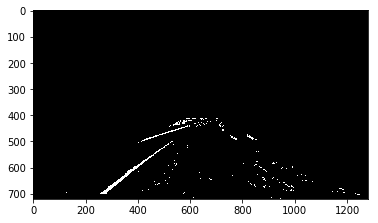

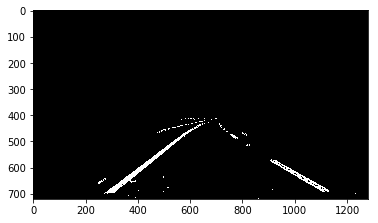

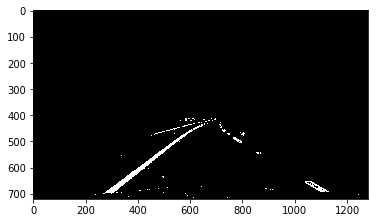

In [9]:
#plot2images(image1=R, image2=binary, 
#            image1cmap='gray', image2cmap='gray',
#            title1='R Channel', title2='R Binary', 
#            save_filename='output_images/color_red.png')
import numpy as np
import cv2
import pickle
import glob
%matplotlib inline
#from tracker import tracker

# Read in the saved camera calibration settings
dist_pickle = pickle.load(open( "./calibration_pickle.p", "rb"))
mtx= dist_pickle['mtx']
dist = dist_pickle['dist']

def preprocess_image(image):
    #preprocessedImage = combined_color_and_gradient(image)
    #preprocessedImage = combined_color_and_gradient3(image)
    preprocessedImage = combined_color_and_gradient4(image)

    preprocessedImage = apply_region_of_interest_mask(preprocessedImage)
    return preprocessedImage


#use the test images
#images = glob.glob('./test_images/test*.jpg')
images = glob.glob('./test_frame_images/frame_4*.jpg')


for idx, fname in enumerate(images):
    # read in image
    img =  mpimg.imread(fname)
    
    # undistort the image
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Preprocess Images
    preprocessedImage = preprocess_image(img)
    
    imageName = 'tracked'+str(idx)+'.jpg'
    #print(imageName)
    plotImage(image=preprocessedImage, image_cmap='gray',  save_filename='./output_images/'+imageName)
    

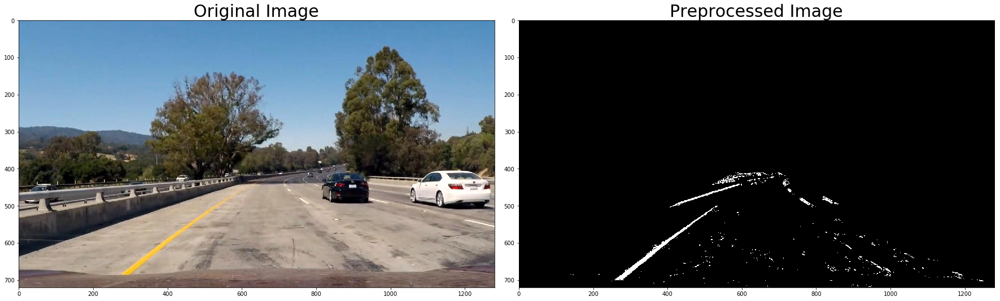

In [10]:
image = mpimg.imread('./test_frame_images/frame_40.jpg')
#image = mpimg.imread('./examples/signs_vehicles_xygrad.png')
 # undistort the image
undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
preprocessedImage = preprocess_image(undistorted_image)
plot2images(image1=image, image2=preprocessedImage, title1='Original Image', title2='Preprocessed Image', image2cmap='gray', save_filename='output_images/orig_vs_preprocessed.png')

### 4.  Apply a perspective transform to rectify binary image ("birds-eye view").

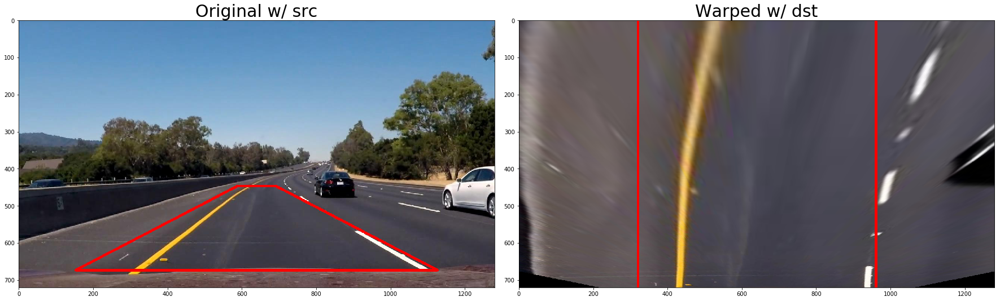

In [11]:
def calc_src_dst(img):
    img_size = (img.shape[1], img.shape[0])
    bottom_width = .76       # percent of bottom trapizoid height
    middle_width = .08       # percent of middle trapizoid height
    height_percentage = .62   # percent of the trapezoid height
    bottom_trim = .935        # percent from top to bottom to avoid car hood
    
    src = np.float32([[img.shape[1]*(.5-middle_width/2), img.shape[0]*height_percentage],
                      [img.shape[1]*(.5+middle_width/2), img.shape[0]*height_percentage],
                      [img.shape[1]*(.5+bottom_width/2), img.shape[0]*bottom_trim],
                      [img.shape[1]*(.5-bottom_width/2), img.shape[0]*bottom_trim]
                     ])
    offset = img_size[0]*.25
    dst = np.float32([[offset, 0], 
                  [img_size[0]-offset, 0], 
                  [img_size[0]-offset, img_size[1]],
                  [offset, img_size[1]]])
    return (src, dst)
    
def perspective_transform (img):
    
    img_size = (img.shape[1], img.shape[0])
    
    (src, dst) = calc_src_dst(img)
    
    #Compute the perspective transform, M, given source and destination points:
    M = cv2.getPerspectiveTransform(src, dst)

    #Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)

    #Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
       
    return (Minv, warped)

def warp_image(img):
    
    # undistort the image
    undistort = np.copy(img)
    undistort = cv2.undistort(undistort, mtx, dist, None, mtx)
    
    # Preprocess Images
    preprocessedImage = preprocess_image(undistort)
    
    Minv, warped = perspective_transform (preprocessedImage)
    return Minv, warped
    

#use the test images
#images = glob.glob('./test_images/straight_lines*.jpg')
#images = glob.glob('./test_images/test*.jpg')
#images = glob.glob('./test_frame_images/frame_*.jpg')
images = glob.glob('./test_frame_images/frame_45.jpg')
for idx, fname in enumerate(images):
    # read in image
    img =  mpimg.imread(fname)
    
    (src, dst) = calc_src_dst(img)
    src_reshape = np.array(src, np.int32).reshape((-1,1,2))
    src_image = np.copy(img)
    cv2.polylines(src_image, [src_reshape], True, (255,0,0), 5)

    # undistort the image
    undistort = np.copy(img)
    undistort = cv2.undistort(undistort, mtx, dist, None, mtx)
    
    # Preprocess Images
    #preprocessedImage = preprocess_image(undistort)
    Minv, warped = perspective_transform (undistort)

    dst_image = np.copy(warped)
    dst_int = np.array(dst, np.int32)
    pt0 = tuple(dst_int[0])
    pt1= tuple(dst_int[1])
    pt2 = tuple(dst_int[2])
    pt3 = tuple(dst_int[3])
    
    cv2.line(dst_image, pt0, pt3, (255,0,0), 5)
    cv2.line(dst_image, pt1, pt2, (255,0,0), 5)
    
    imageName = 'src_dst'+str(idx)+'.jpg'
    plot2images(image1=src_image, image2=dst_image, title1='Original w/ src', title2='Warped w/ dst',  save_filename='./output_images/'+ imageName)


### 5.  Detect lane pixels and fit to find the lane boundary.

./test_frame_images/frame_00.jpg


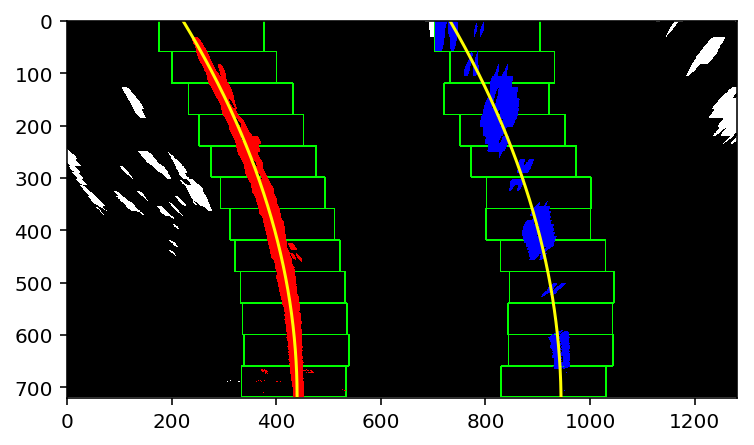

In [12]:
# Line Finding Method: Peaks in a Histogram
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib qt5
%config InlineBackend.figure_format='retina'



#  From Section 33. Finding the Lines from P4: Advance Lane Finding
# Implement Sliding Windows and Fit a Polynomial
def blind_sliding_windows_polyfit (binary_warped):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 12

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
    
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    #debug visiualization
    visualize_fit_lanes = True
    if (visualize_fit_lanes):
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    
    return (left_fit, right_fit)

#images = glob.glob('./test_images/straight_lines1.jpg')
#images = glob.glob('./test_images/straight_lines*.jpg')
#images = glob.glob('./test_images/test*.jpg')
#images = glob.glob('./test_frame_images/frame_*.jpg')
images = glob.glob('./test_frame_images/frame_00.jpg')
for idx, fname in enumerate(images):
    # read in image
    print(fname)
    img =  mpimg.imread(fname)
    Minv, warped = warp_image(img)
    left_fit, right_fit = blind_sliding_windows_polyfit (warped)
    


./test_frame_images\frame_15.jpg


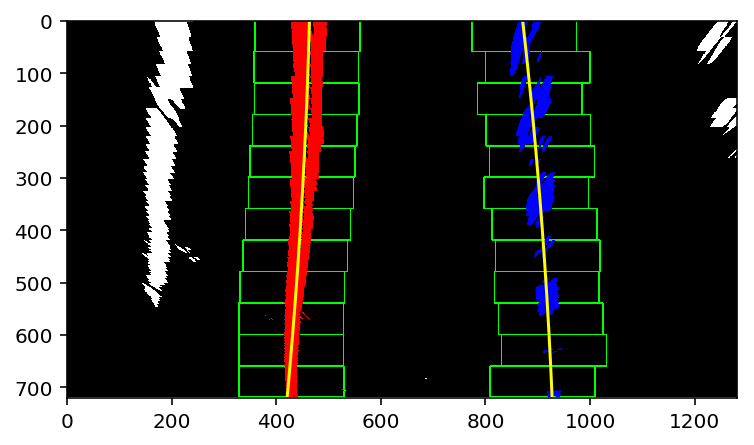

./test_frame_images\frame_16.jpg


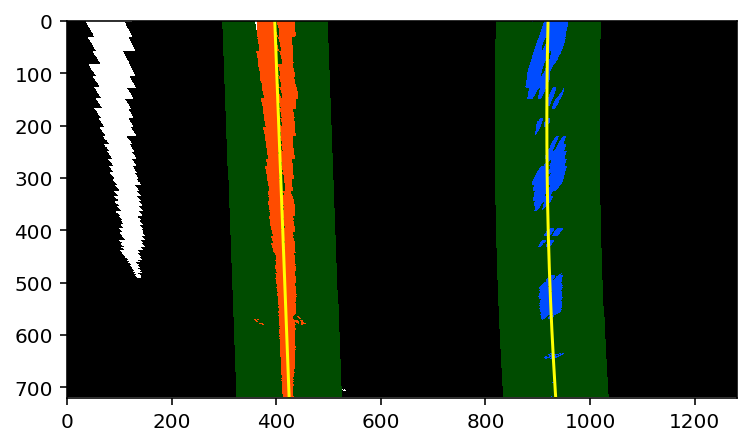

./test_frame_images\frame_17.jpg


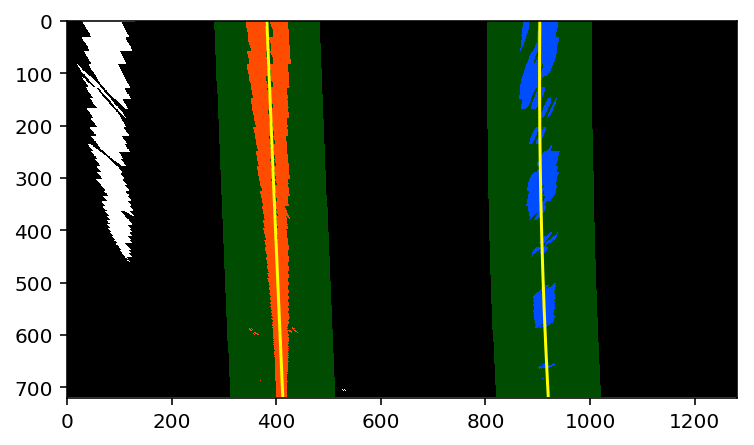

In [13]:
def polyfit_using_previous_fit(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    visualize_fit_lanes2 = True
    if (visualize_fit_lanes2):

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        
    return left_fit, right_fit


images = glob.glob('./test_frame_images/frame_1*.jpg')

left_fit_prev = None
right_fit_prev = None

for idx, fname in enumerate(images):
    # read in image
    print(fname)
    img =  mpimg.imread(fname)
    Minv, warped = warp_image(img)
    
    if (idx == 0):
        left_fit, right_fit = blind_sliding_windows_polyfit (warped)
        left_fit_prev = left_fit
        right_fit_prev = right_fit
    else:
        left_fit_next, right_fit_next = polyfit_using_previous_fit(warped, left_fit_prev, right_fit_prev)
        left_fit_prev = left_fit_next
        right_fit_prev = right_fit_next
        



In [14]:
## OLd
if (False):
    # Line Finding Method: Peaks in a Histogram
    import numpy as np
    import cv2
    import matplotlib.pyplot as plt
    %matplotlib inline
    #%matplotlib qt5
    %config InlineBackend.figure_format='retina'



    #  From Section 33. Finding the Lines from P4: Advance Lane Finding
    # Implement Sliding Windows and Fit a Polynomial
    def find_lanes (binary_warped):

        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 12

        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)

        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Set the width of the windows +/- margin
        margin = 100

        # Set minimum number of pixels found to recenter window
        minpix = 50

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        #left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
        #                  (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        #right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
        #                   (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        #debug visiualization
        visualize_fit_lanes = True
        if (visualize_fit_lanes):
            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
            plt.imshow(out_img)
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
            plt.show()

        visualize_fit_lanes2 = True
        if (visualize_fit_lanes2):
            # Create an image to draw on and an image to show the selection window
            out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
            window_img = np.zeros_like(out_img)

            # Color in left and right line pixels
            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

            # Generate a polygon to illustrate the search window area
            # And recast the x and y points into usable format for cv2.fillPoly()
            left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
            left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
            left_line_pts = np.hstack((left_line_window1, left_line_window2))
            right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
            right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
            right_line_pts = np.hstack((right_line_window1, right_line_window2))

            # Draw the lane onto the warped blank image
            cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
            cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
            result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
            plt.imshow(result, aspect='auto')
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
            plt.show()

        return (left_fitx, right_fitx, left_fit, right_fit)


    #images = glob.glob('./test_images/straight_lines1.jpg')
    #images = glob.glob('./test_images/straight_lines*.jpg')
    #images = glob.glob('./test_images/test*.jpg')
    #images = glob.glob('./test_frame_images/frame_*.jpg')
    images = glob.glob('./test_frame_images/frame_40.jpg')
    for idx, fname in enumerate(images):
        # read in image
        print(fname)
        img =  mpimg.imread(fname)
        Minv, warped = warp_image(img)
        #histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
        #plt.plot(histogram)
        #plt.show()

        #plt.imshow(warped)
        #plt.show()

        left_fitx, right_fitx, left_fit, right_fit = find_lanes (warped)

        #imageName = 'warped'+str(idx)+'.jpg'
        plot2images(image1=img, image2=warped, title1='Original Image', title2='Warped Image', image2cmap='gray', save_filename='./output_images/'+ imageName)


    

./test_frame_images\frame_00.jpg


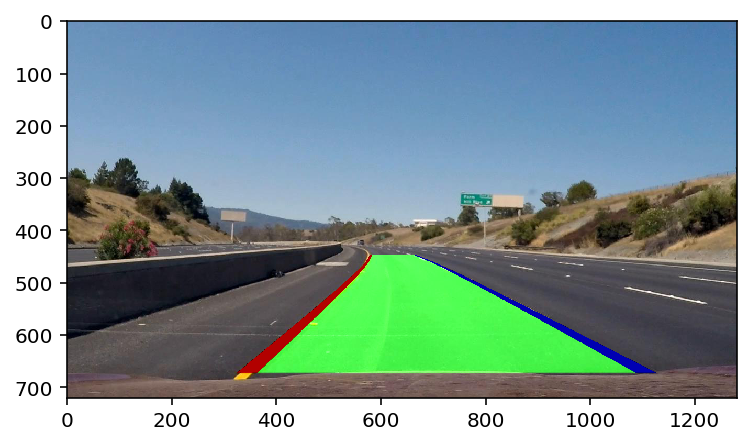

./test_frame_images\frame_01.jpg


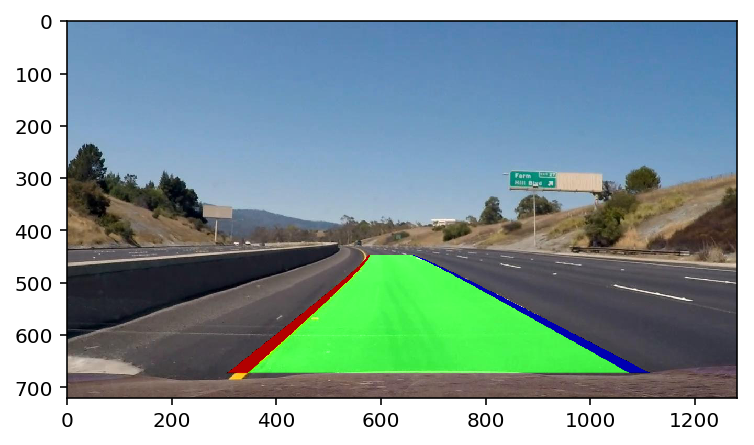

./test_frame_images\frame_02.jpg


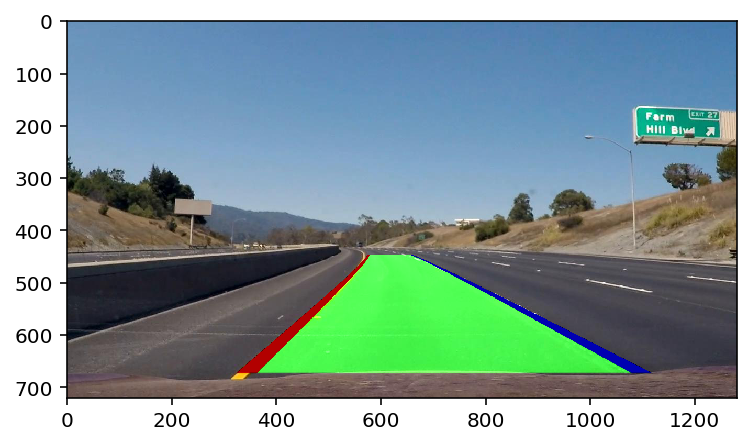

./test_frame_images\frame_03.jpg


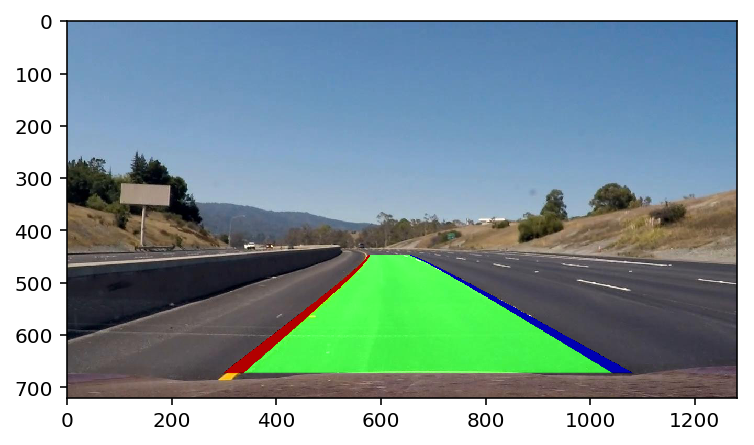

./test_frame_images\frame_04.jpg


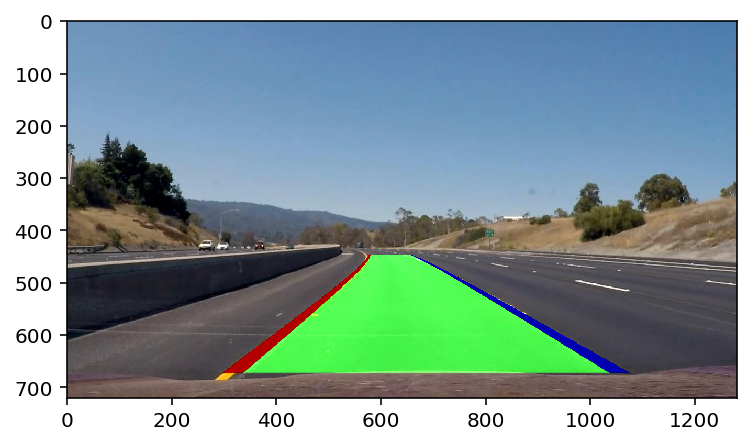

./test_frame_images\frame_05.jpg


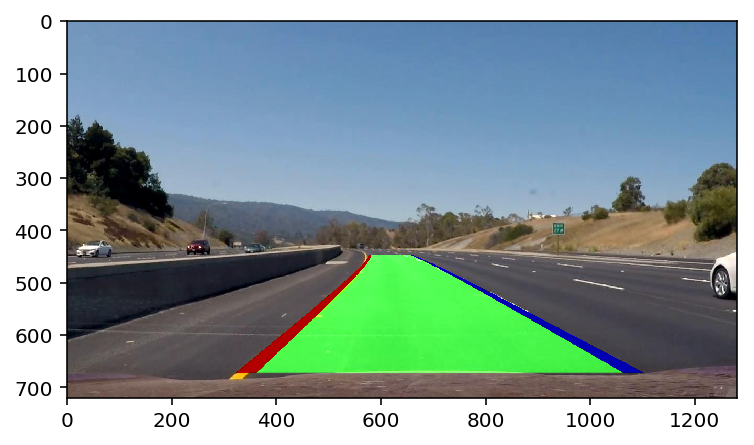

./test_frame_images\frame_06.jpg


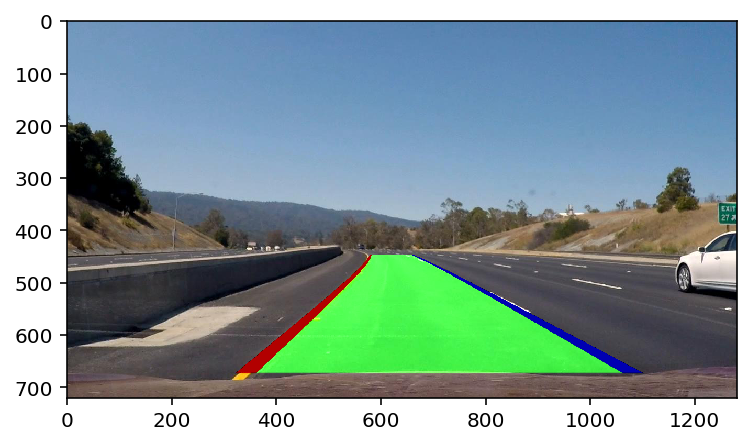

./test_frame_images\frame_07.jpg


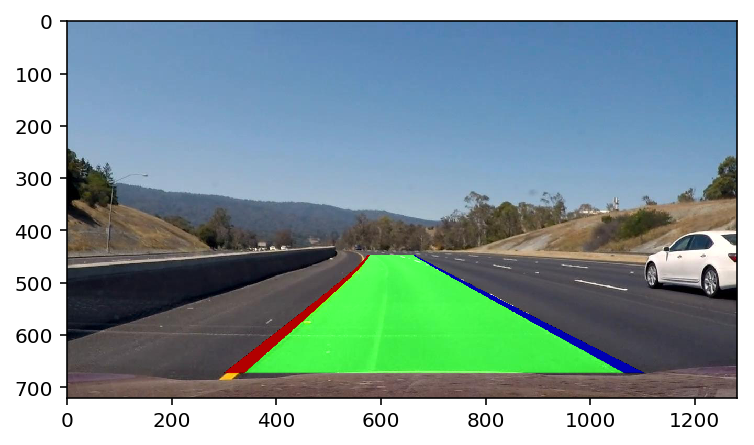

./test_frame_images\frame_08.jpg


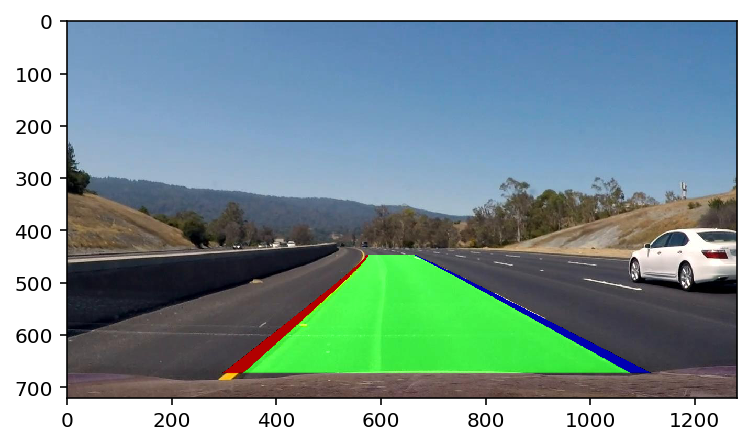

./test_frame_images\frame_09.jpg


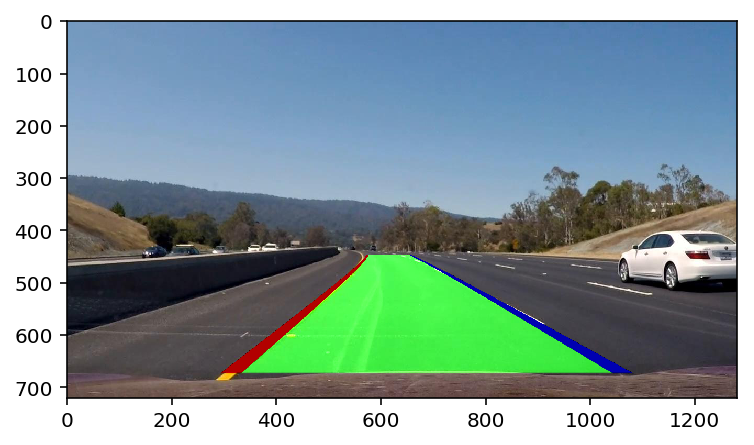

./test_frame_images\frame_15.jpg


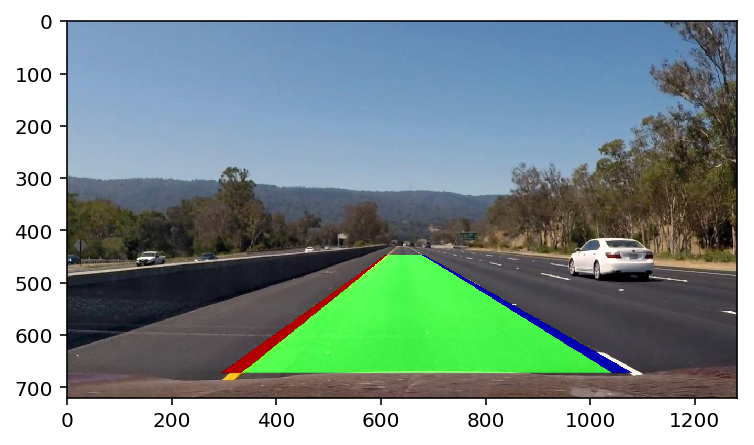

./test_frame_images\frame_16.jpg


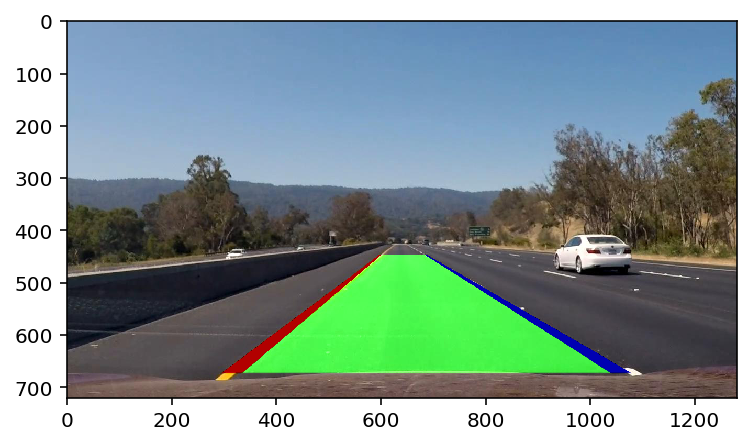

./test_frame_images\frame_17.jpg


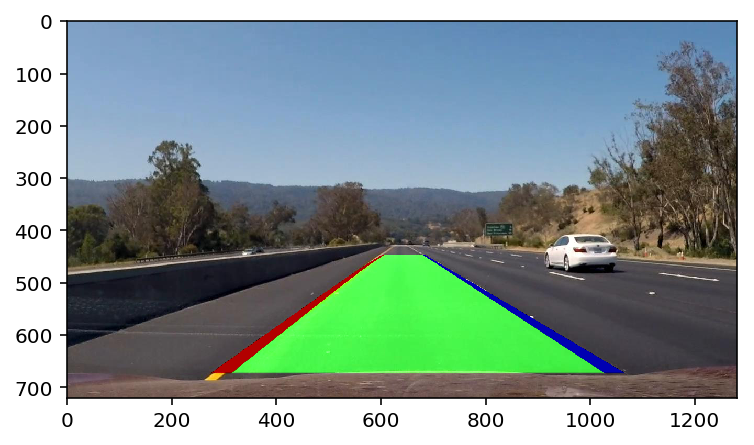

./test_frame_images\frame_30.jpg


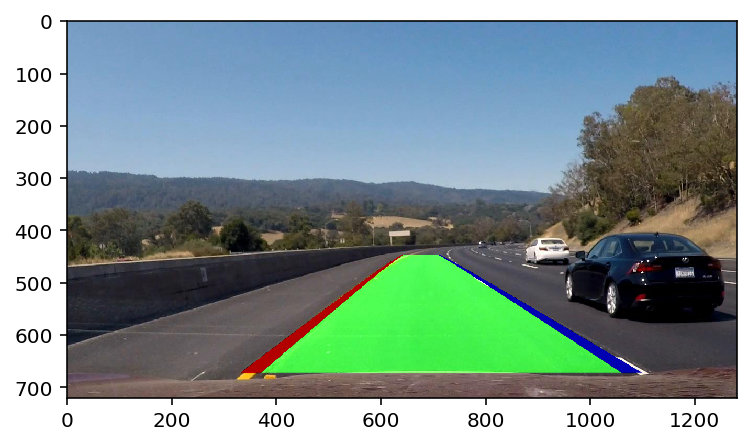

./test_frame_images\frame_40.jpg


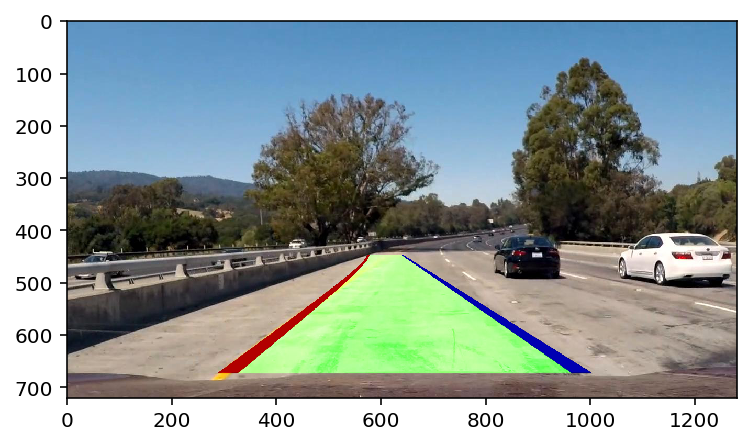

./test_frame_images\frame_45.jpg


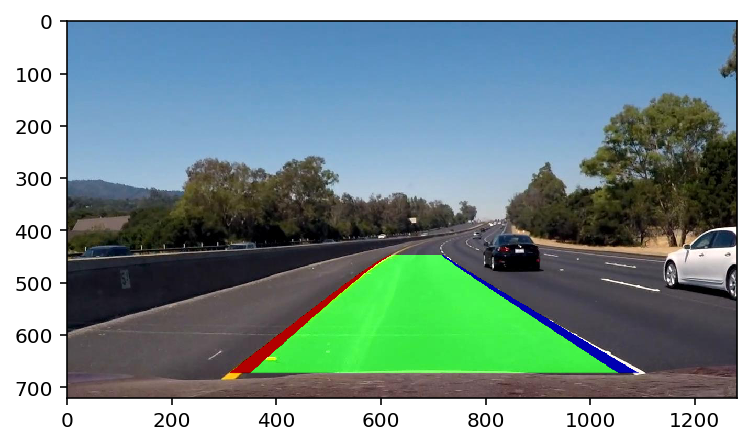

./test_frame_images\frame_46.jpg


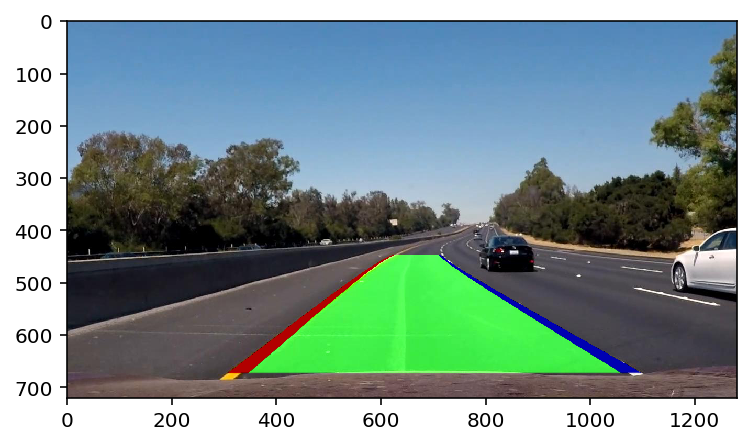

In [54]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

#Self-Driving Car Project Q&A | Advanced Lane Finding
#https://www.youtube.com/watch?v=vWY8YUayf9Q&list=PLAwxTw4SYaPkz3HerxrHlu1Seq8ZA7-5P&index=4

# Define a class to receive the characteristics of each line detection
class Tracker():
    
    #when starting a new instance please be sure to specify all unassigned vairables
    def __init__(self, my_window_width, my_window_height, my_margin, my_ym = 1, my_xm = 1, my_smooth_factor = 15):
        # list that stores all the past (left, right) center set values fuse for smoothing the output
        self.recent_centers =[]
        
        # the window pixel width for the center values, 
        #use to count pixels inside center windows to determine curve values
        self.window_width = my_window_width
        
        # the window pixel height for the center values, 
        #use to count pixels inside center windows to determine curve values
        self.window_height = my_window_height
        
        # the pixel distance in both directions to slide (left_window + right_window) template for searching
        self.margin = my_margin
        
        # meters per pixel in vertical axis
        self.ym_per_pix = my_ym 
        
        # meters per pixel in horiztonal axis
        self.xm_per_pix = my_xm 

        # meters per pixel in horiztonal axis
        self.smooth_factor = my_smooth_factor

    # the main tracking function for finding and storing lane sgement positions
    def find_windows_centroids(self, warped):

        window_width = self.window_width
        window_height = self.window_height
        margin = self.margin 

        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
        r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(warped.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = window_width/2
            l_min_index = int(max(l_center+offset-margin,0))
            l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
            
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            
            # Add what we found for that layer
            window_centroids.append((l_center,r_center))

        self.recent_centers.append(window_centroids)
        
        # return averaged values of the line centers, helps to keep the makers from jumpin garound too much
        return np.average(self.recent_centers[-self.smooth_factor:], axis=0)
    
def process_warpedimage(warped):
    window_width = 25
    window_height = 80
    
    #set up the overall class to do all the tracking
    curve_centers = Tracker(my_window_width = window_width, my_window_height = window_height, 
                            my_margin = 25, my_ym = 10/720, my_xm = 4/384, my_smooth_factor =15)
    
    window_centroids = curve_centers.find_windows_centroids(warped)
    
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    #points used to find the left and right lanes
    rightx = []
    leftx = []
    
    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        
        # add center values found in frme to the list of lane points per left, right
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
    
    #fit the lane boundaries to the left, right center positions found
    yvals = range(0, warped.shape[0])
    
    res_yvals = np.arange(warped.shape[0]-(window_height/2),0,-window_height)
    
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx, np.int32)
    
    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx, np.int32)
        
    left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, left_fitx[::-1]+window_width/2),axis=0),
                                  np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2, right_fitx[::-1]+window_width/2),axis=0),
                                  np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    inner_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, right_fitx[::-1]+window_width/2),axis=0),
                                  np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    
    road = np.zeros_like(img)
    road_bkg = np.zeros_like(img)
    cv2.fillPoly(road, [inner_lane], color=[0,255,0])
    cv2.fillPoly(road, [left_lane], color=[255,0,0])
    cv2.fillPoly(road, [right_lane], color=[0,0,255])
    cv2.fillPoly(road_bkg, [left_lane], color=[255,255,255])
    cv2.fillPoly(road_bkg, [right_lane], color=[255,255,255])
    
    road_warped = cv2.warpPerspective(road, Minv, img_size, flags=cv2.INTER_LINEAR)
    road_warped_bkg = cv2.warpPerspective(road_bkg, Minv, img_size, flags=cv2.INTER_LINEAR)
                             
    base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
    result = cv2.addWeighted(base, 1.0, road_warped, 0.7, 0.0)
    
    #return result
    plt.imshow(result)
    plt.show()
    
    #left_fitx, right_fitx, left_fit, right_fit = find_lanes (warped)

    
def process_image(image):
    Minv, warped = warp_image(img)
    result = process_warpedimage(warped)
    return result
    
    #imageName = 'warped'+str(idx)+'.jpg'
    #plot2images(image1=img, image2=warped, title1='Original Image', title2='Warped Image', image2cmap='gray', save_filename='./output_images/'+ imageName)
#images = glob.glob('./test_images/straight_lines1.jpg')
#images = glob.glob('./test_images/straight_lines*.jpg')
#images = glob.glob('./test_images/test*.jpg')
images = glob.glob('./test_frame_images/frame_*.jpg')
#images = glob.glob('./test_frame_images/frame_40.jpg')
for idx, fname in enumerate(images):
    # read in image
    print(fname)
    img =  mpimg.imread(fname)
    img_size =(img.shape[1], img.shape[0])
    Minv, warped = warp_image(img)
    process_image(warped)

      

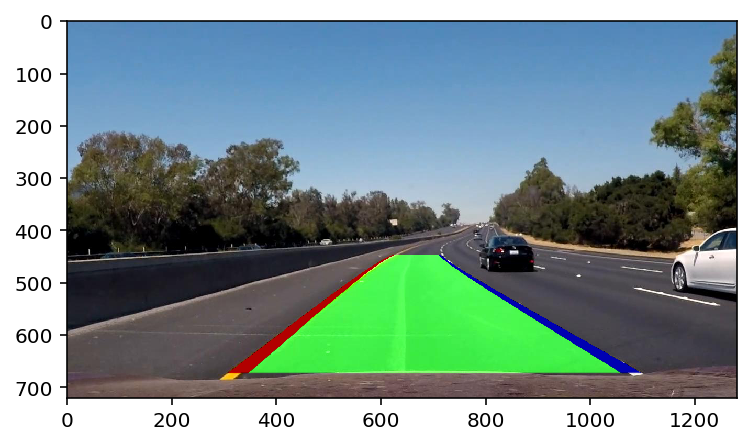

AttributeError: 'NoneType' object has no attribute 'shape'

In [55]:
### Test on Videos
import os
import numpy as np

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

#  Testing of project_video.mp4
output_video = 'output_videos/project_video_output2.mp4'
clip1 = VideoFileClip("./project_video.mp4").subclip(0,50)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

In [ ]:
  # unknown 
    
    # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

### Sliding Window Search

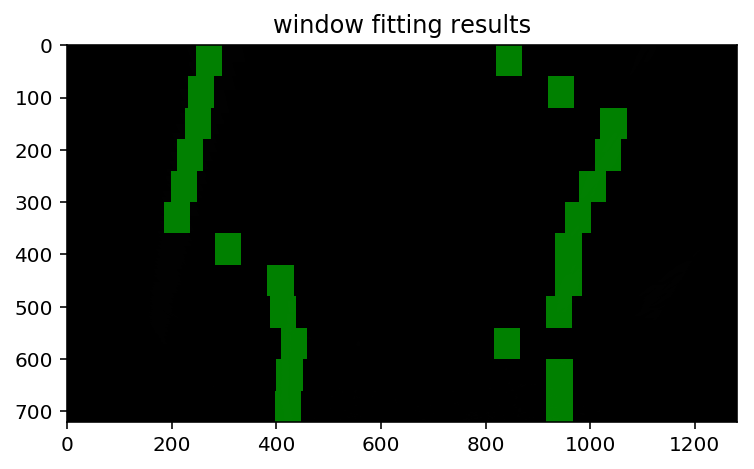

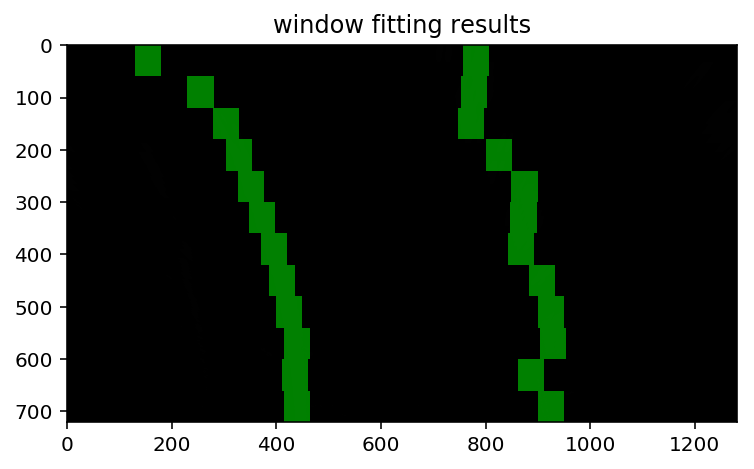

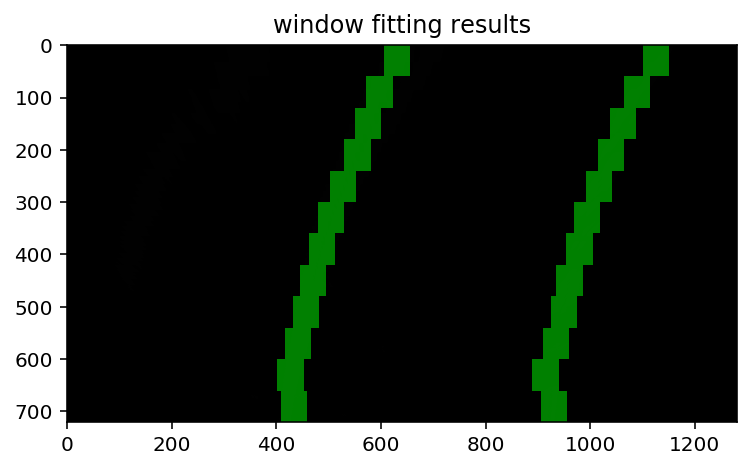

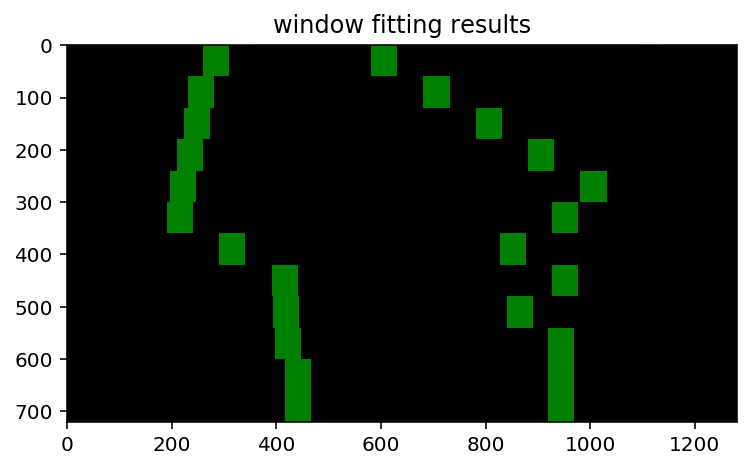

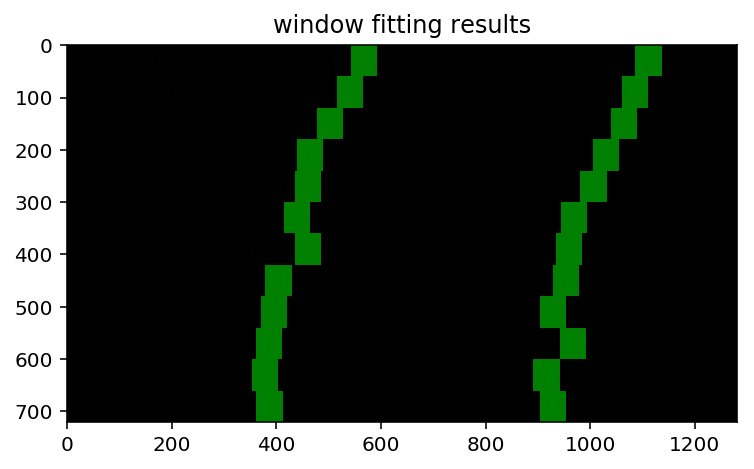

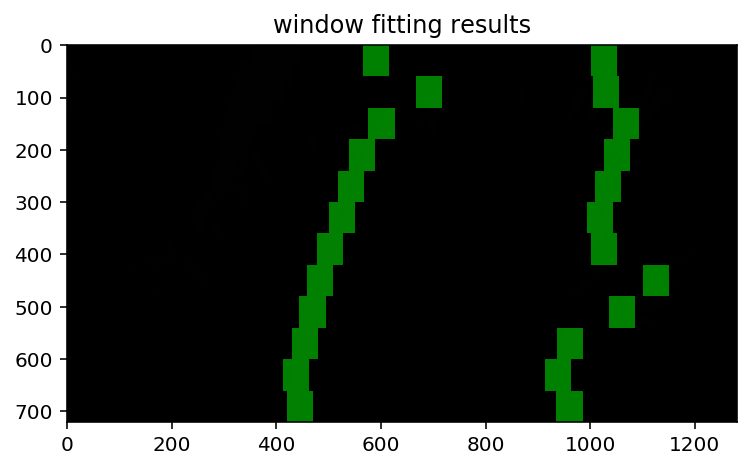

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2



def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def sliding_window_search (warped, window_width, window_height, margin):
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    return output
    

#images = glob.glob('./test_images/straight_lines1.jpg')
#images = glob.glob('./test_images/straight_lines*.jpg')


images = glob.glob('./test_images/test*.jpg')
#images = glob.glob('./test_frame_images/frame_*.jpg')
#images = glob.glob('./test_frame_images/frame_02.jpg')
for idx, fname in enumerate(images):
    # read in image
    img =  mpimg.imread(fname)
    Minv, warped = warp_image(img)

    # window settings
    window_width = 50 
    window_height = 60 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching
    output = sliding_window_search (warped, window_width, window_height, margin)

    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()

In [ ]:
### Tracker

import numpy as np
import cv2



### 6.  Determine the curvature of the lane and vehicle position with respect to center.

In [ ]:
##import numpy as np
##import matplotlib.pyplot as plt

### Generate some fake data to represent lane-line pixels
###ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
##quadratic_coeff = 3e-4 # arbitrary quadratic coefficient

# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
##leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
##                              for y in ploty])
##rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
##                                for y in ploty])

##leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
##rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


### Fit a second order polynomial to pixel positions in each fake lane line
# Fit a second order polynomial to pixel positions in each lane line
#left_fit = np.polyfit(ploty, leftx, 2)
#left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#right_fit = np.polyfit(ploty, rightx, 2)
#right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

### Plot up the fake data
# Plot up
##mark_size = 3
##plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
##plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
##plt.xlim(0, 1280)
##plt.ylim(0, 720)
##plt.plot(left_fitx, ploty, color='green', linewidth=3)
##plt.plot(right_fitx, ploty, color='green', linewidth=3)
##plt.gca().invert_yaxis() # to visualize as we do the images

In [ ]:
def radius_of_curvature(binary_image, left_fit, right_fit, leftx, rightx):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    
    h = binary_image.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Example values: 1926.74 1908.48
    #print(left_curverad, right_curverad)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m    return (left_curverad, right_curverad)

    # Determine the offset of the vehicle in the lane.
    #  We can assume the the lane is about 30 meters long and 3.7 meters wide
    dist_from_center = 0.0
    img_size = (binary_image.shape[1], binary_image.shape[0])
    if right_fit is not None:
        if left_fit is not None:
            #  Assume the center of camera frame is directly in the center of the vehicle
            camera_pos = img_size[1] / 2
            
            # find where the right and left lanes intersect the bottom of the frame
            left_lane_pix = np.polyval(left_fit, img_size[0])
            right_lane_pix = np.polyval(right_fit, img_size[0])
            center_of_lane_pix = (left_lane_pix + right_lane_pix) / 2
            dist_from_center = (camera_pos - center_of_lane_pix) * xm_per_pix
                
    return left_curverad, right_curverad, dist_from_center

#images = glob.glob('./test_images/straight_lines1.jpg')
#images = glob.glob('./test_images/straight_lines*.jpg')
#images = glob.glob('./test_images/test*.jpg')
images = glob.glob('./test_frame_images/frame_02.jpg')

for idx, fname in enumerate(images):
    # read in image
    img =  mpimg.imread(fname)
    Minv, warped = warp_image(img)
    #histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram)
    #plt.show()
    
    #plt.imshow(warped)
    #plt.show()
    
    left_fitx, right_fitx, left_fit, right_fit = find_lanes (warped)
    left_curverad, right_curverad, dist_from_center = radius_of_curvature(warped, left_fit, right_fit, left_fitx, right_fitx)
    
    #print(left_curverad, ' m', right_curverad, ' m')    
    #print(dist_from_center, ' m')
    
    #imageName = 'warped'+str(idx)+'.jpg'
    #plot2images(image1=img, image2=warped, title1='Original Image', title2='Warped Image', image2cmap='gray', save_filename='./output_images/'+ imageName)







### 7.  Warp the detected lane boundaries back onto the original image.

In [ ]:
def warp_lane_boundaries_back(undist, warped, Minv, left_fitx, right_fitx):
    
    h = warped.shape[0]
    ploty = np.linspace(0, h-1, h)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # add red left lane line, and blue right lane line
    #cv2.polylines(color_warp, np.int32([pts_left]), isClosed = False, color = (255,0,0), thickness = 20)
    #cv2.polylines(color_warp, np.int32([pts_right]), isClosed = False, color = (0,0,255), thickness = 20)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result


#images = glob.glob('./test_images/straight_lines2.jpg')
#images = glob.glob('./test_images/test*.jpg')
#images = glob.glob('./test_frame_images/frame_*.jpg')
images = glob.glob('./test_frame_images/frame_40.jpg')
for idx, fname in enumerate(images):
      # read in image
    org_image =  mpimg.imread(fname)
    Minv, warped = warp_image(org_image)
    left_fitx, left_fity, left_fit, right_fit = find_lanes (warped)
    
    result = warp_lane_boundaries_back(org_image, warped, Minv, left_fitx, right_fitx)
    
    imageName = 'lanelines'+str(idx)+'.jpg'
    plot2images(image1=org_image, image2=result, title1='Original Image', title2='With Lane Lines', save_filename='./output_images/'+ imageName)


In [ ]:
images = glob.glob('./test_frame_images/frame_40.jpg')
for idx, fname in enumerate(images):
      # read in image
    org_image =  mpimg.imread(fname)
    Minv, warped = warp_image(org_image)
    left_fitx, left_fity, left_fit, right_fit = find_lanes (warped)
    
    result = warp_lane_boundaries_back(org_image, warped, Minv, left_fitx, right_fitx)
    
    imageName = 'lanelines'+str(idx)+'.jpg'
    plot2images(image1=org_image, image2=result, title1='Original Image', title2='With Lane Lines', save_filename='./output_images/'+ imageName)


### 8.  Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_color = (255,255,255)
    num_format = '{:04.2f}'
    text = 'Radius of Curvature: ' + num_format.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, font_color, 2, cv2.LINE_AA)
    direction = 'left'
    if center_dist > 0:
        direction = 'right'
    abs_center_dist = abs(center_dist)
    text = 'Vehicle is ' + num_format.format(abs_center_dist) + ' m ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, font_color, 2, cv2.LINE_AA)
    return new_img

#images = glob.glob('./test_images/test*.jpg')
#images = glob.glob('./test_frame_images/frame_*.jpg')
images = glob.glob('./test_frame_images/frame_40.jpg')
for idx, fname in enumerate(images):
      # read in image
    org_image =  mpimg.imread(fname)
    Minv, warped = warp_image(org_image)
    left_fitx, left_fity, left_fit, right_fit = find_lanes (warped)
    
    lane_image = warp_lane_boundaries_back(org_image, warped, Minv, left_fitx, right_fitx)
    
    left_curverad, right_curverad, dist_from_center = radius_of_curvature(warped, left_fit, right_fit, left_fitx, right_fitx)
   
    avg_curverad = (left_curverad + right_curverad) / 2
    result = draw_data(lane_image, avg_curverad, dist_from_center)
    
    imageName = 'lanelines2'+str(idx)+'.jpg'
    plot2images(image1=org_image, image2=result, title1='Original Image', title2='Processed Image', save_filename='./output_images/'+ imageName)


## Processing of Project Videos

In [ ]:
### Pipeline
def find_lanes_advanced (image):
    # The output you return should be a color image (3 channel)
    # returns the final output (image with drawn on lane lines)
    
    #result = np.copy(image)
    org_image =  np.copy(image)
    Minv, warped = warp_image(org_image)
    left_fitx, left_fity, left_fit, right_fit = find_lanes (warped)
    
    lane_image = warp_lane_boundaries_back(org_image, warped, Minv, left_fitx, right_fitx)
    
    left_curverad, right_curverad, dist_from_center = radius_of_curvature(warped, left_fit, right_fit, left_fitx, right_fitx)
   
    avg_curverad = (left_curverad + right_curverad) / 2
    result = draw_data(lane_image, avg_curverad, dist_from_center)
   
    
    return result


In [ ]:
### Test on Videos
import os
import numpy as np

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def ensure_dir_exists(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)

    result = find_lanes_advanced(image)
    return result


In [ ]:
#  Testing of project_video.mp4
output_video = 'output_videos/project_video_output.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

In [ ]:
output_video = 'output_videos/project_video_output.mp4'
ensure_dir_exists('./output_videos')
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("./project_video.mp4").subclip(0,50)


for t in range (45, 46, 1):
    filename = './test_frame_images/frame_' + str(t) + '.jpg'
    clip1. save_frame(filename, t=t, withmask=True)
    
    
clip1.reader.close()
clip1.audio.reader.close_proc()
#clip1 = VideoFileClip("./project_video.mp4")
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
#%time white_clip.write_videofile(output_video, audio=False)

In [ ]:
#  Testing of challenge_video.mp4
output_video = 'output_videos/challenge_video_output.mp4'
clip1 = VideoFileClip("./challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()


In [ ]:
#  Testing of harder_challenge_video.mp4
output_video = 'output_videos/harder_challenge_video_output.mp4'
clip1 = VideoFileClip("./harder_challenge.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)

### Appendix - randon testing of color thresholds

In [ ]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output




In [ ]:
#tom's early testing

def testing_combined_thresholds(image):
    # Choose a Sobel kernel size
    ksize = 5 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(40, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    #combined[((gradx == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    return combined
    
image = mpimg.imread('./examples/signs_vehicles_xygrad.png')
combined_threshold = testing_combined_thresholds(image)
plot2images(image1=image, image2=combined_threshold, title1='Original Image', title2='Combined Thresholds', image2cmap='gray', save_filename='output_images/combined_thresholds.png')

### Color Thresholds

R channel still does rather well on the white lines, perhaps even better than the S channel. 
  As with gradients, it's worth considering how you might combine various color thresholds to 
  make the most robust identification of the lines.

In [ ]:
def G_thres(image, g_thresh=(0, 255)):
    # Calculate the R Channel Threshold
    G = image[:,:,1]
    g_binary = np.zeros_like(G)
    g_binary[(G > g_thresh[0]) & (G <= g_thresh[1])] = 1
    return g_binary

def R_thres(image, r_thresh=(0, 255)):
    # Calculate the R Channel Threshold
    R = image[:,:,0]
    r_binary = np.zeros_like(R)
    r_binary[(R > r_thresh[0]) & (R <= r_thresh[1])] = 1
    return r_binary

def S_thres(image, s_thresh=(0, 255)):
    # Calculate the S Channel Threshold
    # Convert to HLS
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    thresh = (90, 255)
    s_binary = np.zeros_like(S)
    s_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return s_binary

def testing_yellow_lanes(image):
    r_binary = R_thres(image, r_thresh = (200, 255))
    g_binary = G_thres(image, g_thresh = (20, 100))
    combined = np.zeros_like(r_binary)
    combined[((r_binary == 1) | (g_binary == 1))] = 1
    return combined

def testing_white_lanes(image):
    r_binary = R_thres(image, r_thresh = (200, 255))
    s_binary = S_thres(image, s_thresh = (20,100))
    combined = np.zeros_like(r_binary)
    combined[((r_binary == 1) & (s_binary == 1))] = 1
    return combined

def testing_combined_colors_thresholds(image):
    r_binary = R_thres(image, r_thresh = (200, 255))
    s_binary = S_thres(image, s_thresh = (0, 75))
    combined = np.zeros_like(r_binary)
    combined[((r_binary == 1) | (s_binary == 1))] = 1
    return combined

    
#image = mpimg.imread('./examples/signs_vehicles_xygrad.png')
#image = mpimg.imread('./examples/bridge_shadow.jpg')
#image = mpimg.imread('./test_images/test5.jpg')

r_binary = R_thres(image, r_thresh = (200, 255))
#g_binary = G_thres(image, g_thresh = (0, 50))
s_binary = S_thres(image, s_thresh = (0,75))

#plt.title = 'R Channel'
#plt.savefig('./output_images/chessboard.png')
#plt.imshow(r_binary, cmap='gray')
#plt.show()

r_binary = R_thres(image, r_thresh = (200, 255))
plt.imshow(r_binary, cmap='gray')
plt.show()

plt.imshow(s_binary, cmap='gray')
plt.show()

#plot2images(image1=r_binary, image2=g_binary, title1='R Channel', title2='G Channel', image1cmap='gray', image2cmap='gray', save_filename='output_images/r_s_thresholds.png')
#s_binary = S_thres(image, s_thresh = (90, 255))
#plot2images(image1=s_binary, image2=s_binary, title1='S Channel', title2='S Channel', image1cmap='gray', image2cmap='gray', save_filename='output_images/r_s_thresholds.png')

combined_threshold = testing_combined_colors_thresholds(image)
plot2images(image1=image, image2=combined_threshold, title1='Original Image', title2='Combined Color Thresholds', image2cmap='gray', save_filename='output_images/combined_color_thresholds.png')




In [ ]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Create a masked image
image = mpimg.imread('./examples/signs_vehicles_xygrad.png')

image_y = image.shape[0]
image_x = image.shape[1]
x_factor = 40
y_factor = 60
vertices = np.array([[
        (0,image_y),
        (((image_x/2)- x_factor), (image_y/2)+ y_factor), 
         (((image_x/2) + x_factor), (image_y/2)+ y_factor), 
         (image_x,image_y)]], dtype=np.int32)
masked_edges = region_of_interest(image, vertices)

masked_edges = region_of_interest(image, vertices)
plotImage(image=image,  save_filename=None)
          #'./output_images/'+imageName)
    



In [ ]:
def create_threshold_binary_image(img):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    #plot2images(l_channel, scaled_sobel, "Grayscale", "Scaled Sobel", image1cmap='gray', image2cmap='gray', save_filename='./output_images/grayscaleAndScaledSobel.png')
    
    #sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    #abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    #scaled_sobel2 = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    #plot2images(scaled_sobel, scaled_sobel2, "Grayscale", "L Channel", image1cmap='gray', image2cmap='gray', save_filename='./output_images/GreyAndLScaledSobels.png')
    
    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    #plot2images(sxbinary, s_binary, "Threshold x Gradient", "Threshold Color Channel", image1cmap='gray', image2cmap='gray', save_filename='./output_images/thresholds.png')
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    #plt.imshow(color_binary)
    #plt.savefig('output_images/color_binary.png')
    #plt.show()

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return (color_binary, combined_binary)

# Some interesting things to explore might include: the H channel, different 
# threshold values for color and gradient binary images, and even a different 
# color space, like HSV!

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

image = mpimg.imread('./examples/color-shadow-example.jpg')
##image = mpimg.imread('./examples/signs_vehicles_xygrad.png')
color_binary, tbinary_image = create_threshold_binary_image(image)
plot2images(image1=color_binary, image2=tbinary_image, title1='Stacked thresholds', title2='Combined S channel and gradient thresholds', image2cmap='gray', save_filename='output_images/orig_vs_combinedThresholds.png')

#plt.imshow(color_binary)
#plt.savefig('output_images/color_binary.png')
#plt.show()



#  OLD

### Calibrating a Camera

### Perspective transform

In [ ]:
### Gradient Threshold
### Canny

In [ ]:
### Sobel Operator


In [ ]:
### Magnitude of the Gradient

In [ ]:
### Direction of the gradient

In [ ]:
### Combining Thresholds

In [ ]:
### Colorspace Thresholding